# loading numpy  matplotlib Scipy 

In [4]:
%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt
from scipy  import misc

# Create Numpy array  from an image file

In [5]:
from skimage import data    

photo_data = misc.imread("C:\\Users\\Sauraj\\Downloads\\DataSets\\wifire\\sd-3layers.jpg") # scipy pakage used

type(photo_data)  # type of image data

C:\Users\Sauraj\Anaconda3\lib\site-packages\ipykernel_launcher.py:3: DeprecationWarning: `imread` is deprecated!
`imread` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``imageio.imread`` instead.
  This is separate from the ipykernel package so we can avoid doing imports until


numpy.ndarray

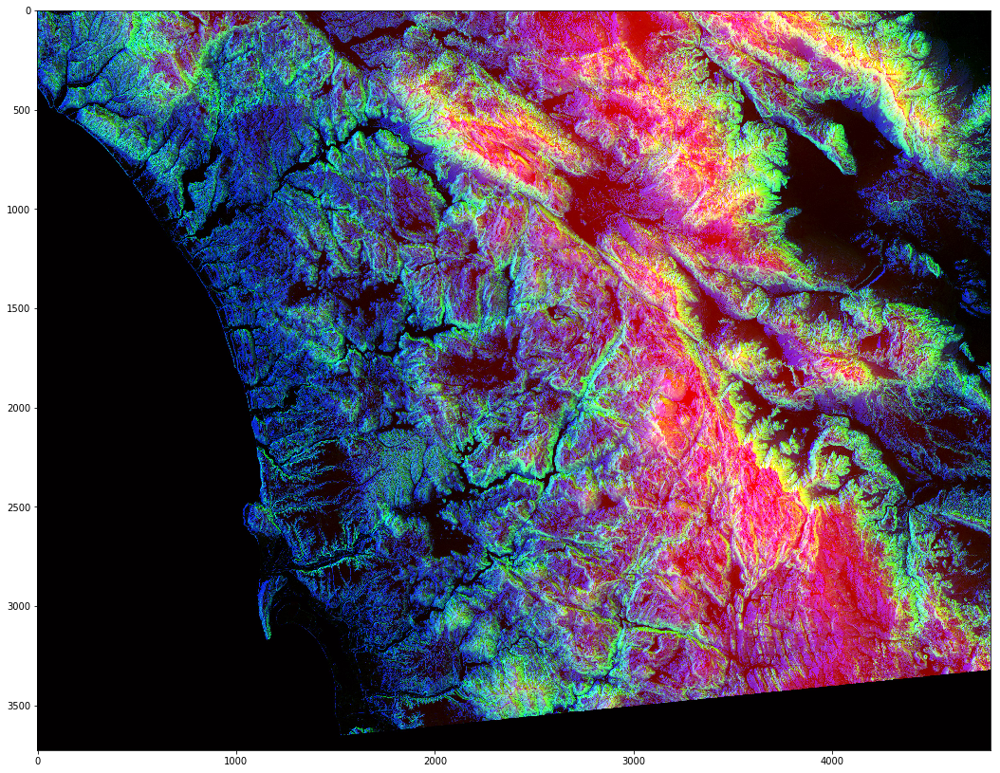

In [7]:
plt.figure(figsize=(18,18))  # this is used to set size of image
plt.imshow(photo_data)   # show the image

# shape of image is (height, width ,layers)  : layer-> 3 (red, green ,blue)
  
  ## each color is 8 bit  and the range of color (0-255) ,
  
  ## (red , green , blue)- (255,255,255) - white color

In [8]:
photo_data.shape

(3725, 4797, 3)

In [9]:
photo_data.size

53606475

In [11]:
photo_data.min(),photo_data.max()  # color value start from 0 to 255

(0, 255)

In [13]:
 photo_data.mean()  # Avg of pixel value

75.8299354508947

# we are working  with pixel 150,250

# Pixel on the 150th row and 250th column  what is rgb value of (row ,col)

In [15]:
photo_data[150,250]  # result show that  17 are Red , 35 are green , 255 are blue

array([ 17,  35, 255], dtype=uint8)

# [ row ,column, layer]    ; layer 0-red, 1-green , 2- blue

In [17]:
photo_data[150,250,1] # In the we get green color

35

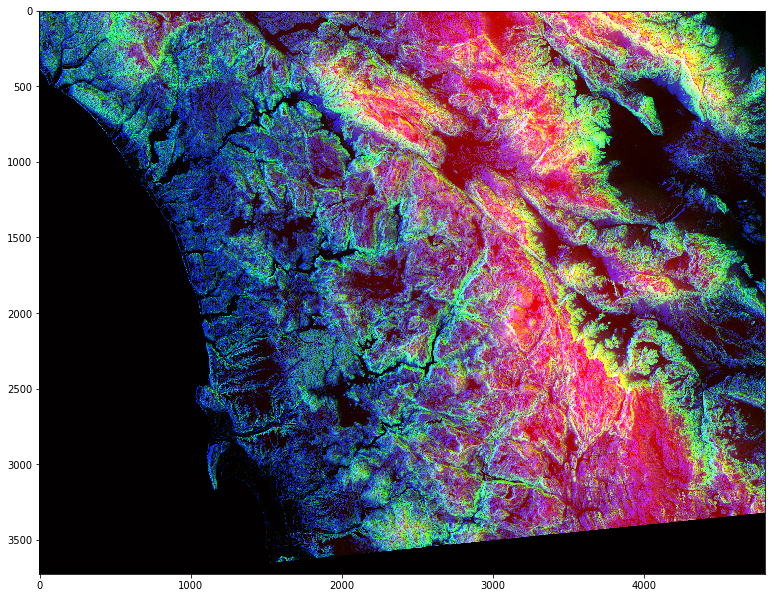

In [18]:
photo_data[150,250]=0  # ASSIGNING THIS PIXEL TO ZERO
plt.figure(figsize=(13,13))
plt.imshow(photo_data)

C:\Users\Sauraj\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: DeprecationWarning: `imread` is deprecated!
`imread` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``imageio.imread`` instead.
  """Entry point for launching an IPython kernel.


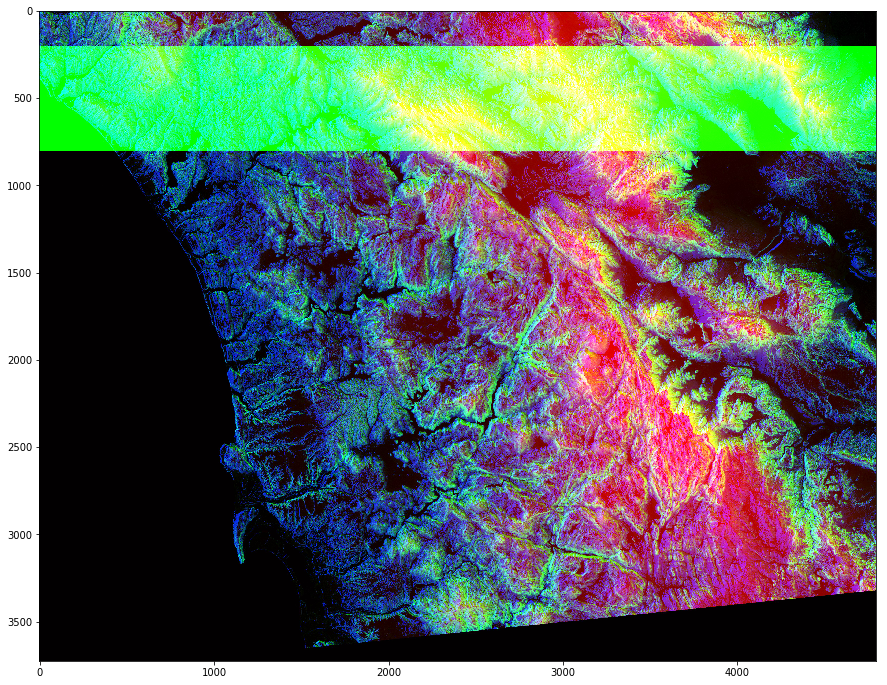

In [19]:
 photo_data = misc.imread("C:\\Users\\Sauraj\\Downloads\\DataSets\\wifire\\sd-3layers.jpg")
photo_data[200:800,:,1]=255   # we increase the intensity of green (1) color 
plt.figure(figsize=(15,15))
plt.imshow(photo_data)

C:\Users\Sauraj\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: DeprecationWarning: `imread` is deprecated!
`imread` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``imageio.imread`` instead.
  """Entry point for launching an IPython kernel.


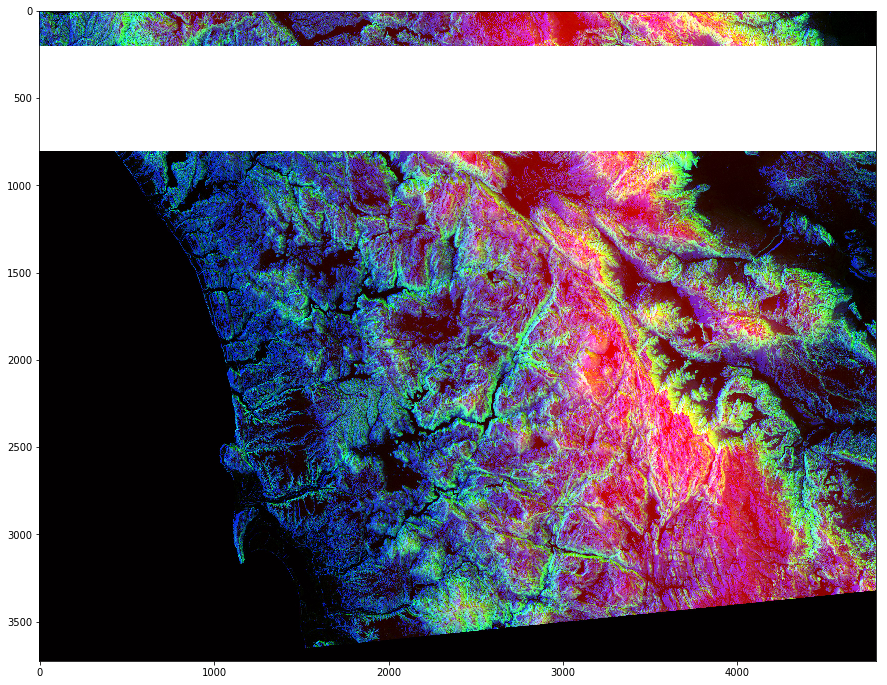

In [20]:
 photo_data = misc.imread("C:\\Users\\Sauraj\\Downloads\\DataSets\\wifire\\sd-3layers.jpg")
photo_data[200:800,:]=255   # we increase the intensity of all the color (rgb)
plt.figure(figsize=(15,15))
plt.imshow(photo_data)

C:\Users\Sauraj\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: DeprecationWarning: `imread` is deprecated!
`imread` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``imageio.imread`` instead.
  """Entry point for launching an IPython kernel.


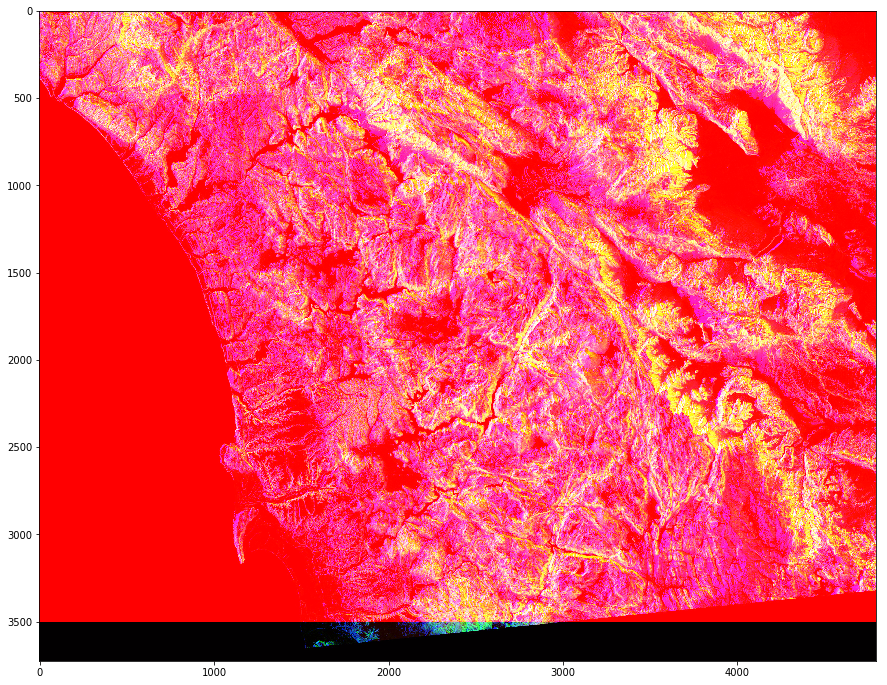

In [24]:
 photo_data = misc.imread("C:\\Users\\Sauraj\\Downloads\\DataSets\\wifire\\sd-3layers.jpg")
photo_data[0:3500,:,0]=255 # we decrease the intensity of all the color (rgb)
plt.figure(figsize=(15,15))
plt.imshow(photo_data)

# we get  those pixel whos intensity value is less then 200 then turn that pixel into zero 

# Pick pixel with low intensity

In [31]:
 photo_data = misc.imread("C:\\Users\\Sauraj\\Downloads\\DataSets\\wifire\\sd-3layers.jpg")
print(photo_data.shape)
low_intensity_pixel= photo_data< 200 # we select the pixel having less intensity then 50 

print(low_intensity_pixel.size)
print(photo_data.size)
print(low_intensity_pixel.shape)

C:\Users\Sauraj\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: DeprecationWarning: `imread` is deprecated!
`imread` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``imageio.imread`` instead.
  """Entry point for launching an IPython kernel.


(3725, 4797, 3)
53606475
53606475
(3725, 4797, 3)


# filter out low values

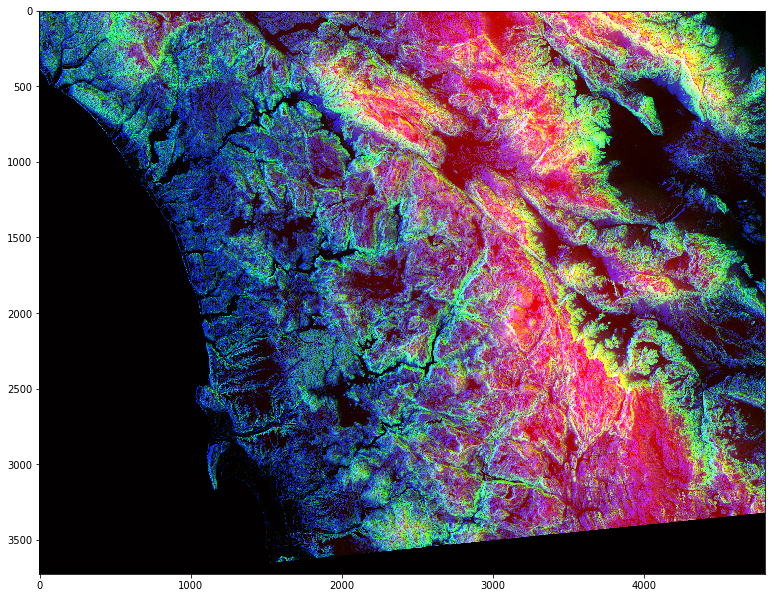

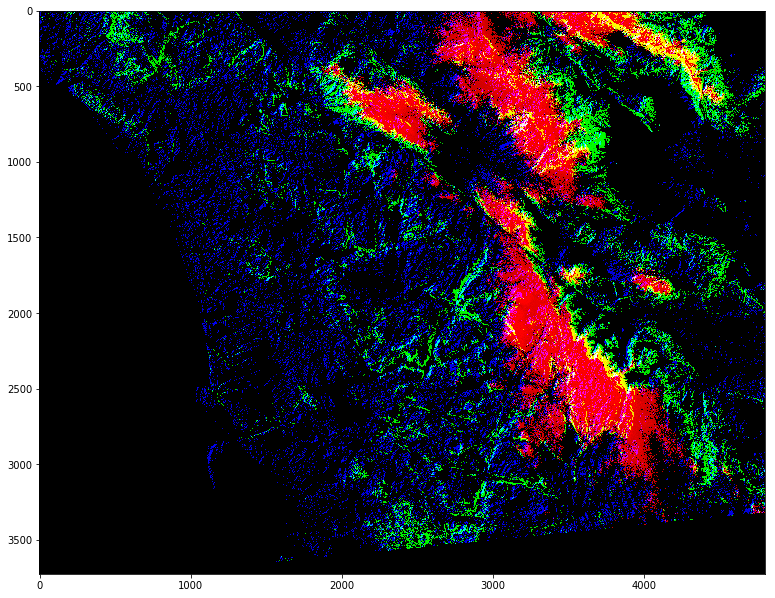

In [32]:
#import random
plt.figure(figsize=(13,13))
plt.imshow(photo_data)
photo_data[low_intensity_pixel]=0  # we change the pixel intensity to zero 
plt.figure(figsize=(13,13))
plt.imshow(photo_data)

In [19]:
row_range= np.arange(len(photo_data))   # we calculate the range length of image and width of image 
col_range =row_range                     #  length 0-3725 and  width 0-3725
print(type(row_range))
print(len(photo_data))
print(row_range.shape)
print(col_range.shape)

<class 'numpy.ndarray'>
3725
(3725,)
(3725,)


In [8]:
photo_data[row_range,col_range]=255

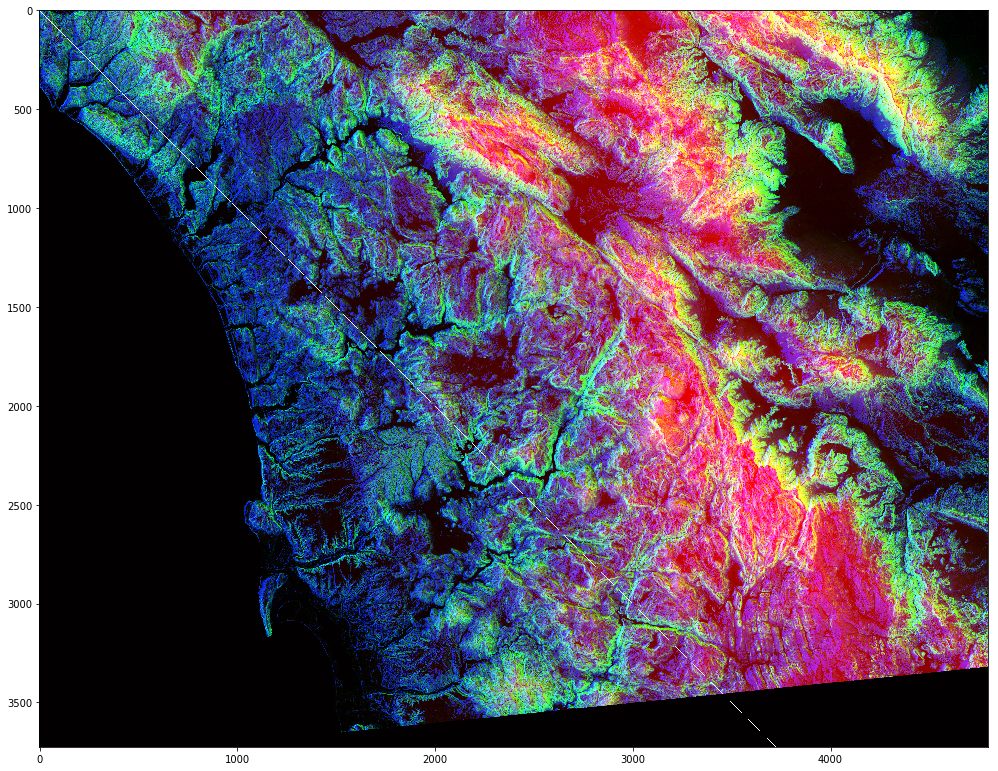

In [11]:
plt.figure(figsize=(17,17))
plt.imshow(photo_data)

# MASKING

## total_row ,total_col, total_layers
## we create  range X (total_row ,1 col) vector , Y(1 row ,total_col)

In [18]:
total_row ,total_col ,total_layer = photo_data.shape

X,Y = np.ogrid[:total_row, :total_col]    # we create two vector total_row ,total_col 

print(X.shape,",",Y.shape)

(3725, 1) , (1, 4797)


In [20]:
center_col, center_row= total_row/2 ,total_col/2
print("center point is ",center_col,center_row)

center point is  1862.5 2398.5


## we Calculate Euclidean distance from center point to all other point X and Y  called distance_from_center
 ## if (distance_from_center  > radius)
    ***its outside of circle ( true)***
    

In [58]:
dist_from_center= (X- center_row)**2+ (Y-center_col)**2      # euclidean distance

# we  calculate the dist from center to all the point in vector
#print(X- center_row)
#print("################")
#print(Y-center_col)
#print(dist_from_center)
#print((total_row/2)**2)

radius =(total_row/2)**2

circular_musk = dist_from_center > radius
print(circular_musk)

[[ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]
 ...
 [ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]]


C:\Users\Sauraj\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: DeprecationWarning: `imread` is deprecated!
`imread` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``imageio.imread`` instead.
  """Entry point for launching an IPython kernel.


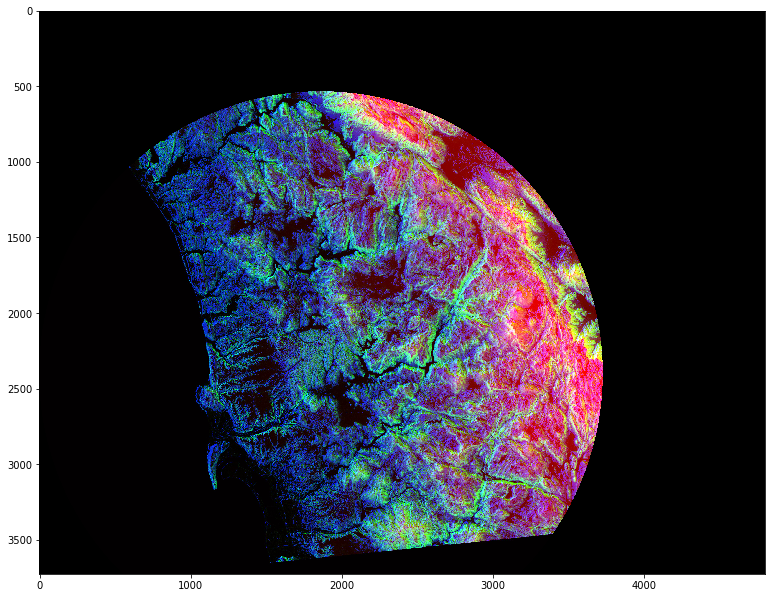

In [59]:
photo_data = misc.imread("C:\\Users\\Sauraj\\Downloads\\DataSets\\wifire\\sd-3layers.jpg")
photo_data[circular_musk]=0
plt.figure(figsize=(13,13))
plt.imshow(photo_data)

## furture Masking

In [63]:
X,Y = np.ogrid[:total_row, :total_col] 
upper_mask = X < center_row
print(upper_mask)

half_upper_mask =np.logical_and(upper_mask,circular_musk)

[[ True]
 [ True]
 [ True]
 ...
 [False]
 [False]
 [False]]


C:\Users\Sauraj\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: DeprecationWarning: `imread` is deprecated!
`imread` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``imageio.imread`` instead.
  


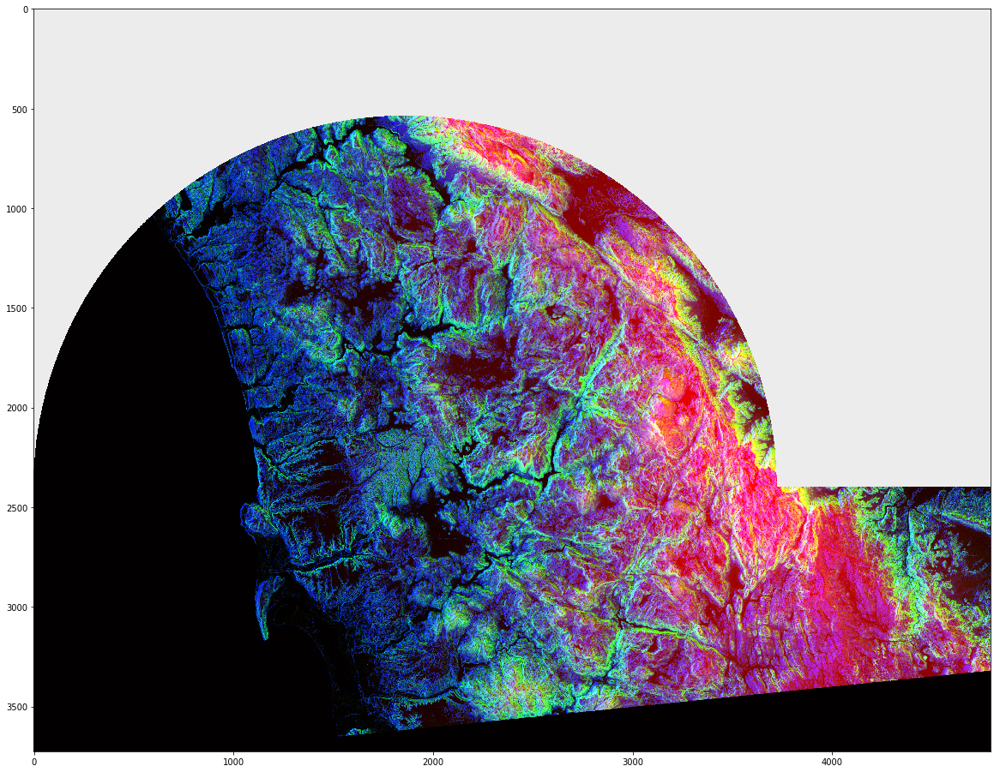

In [69]:
#import random
photo_data = misc.imread("C:\\Users\\Sauraj\\Downloads\\DataSets\\wifire\\sd-3layers.jpg")
photo_data[half_upper_mask]=255
#photo_data[half_upper_mask]= random.randint(200,255)
plt.figure(figsize=(20,20))
plt.imshow(photo_data)

# further processing of satalite image

# Detecting the green High intensity pixel

C:\Users\Sauraj\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: DeprecationWarning: `imread` is deprecated!
`imread` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``imageio.imread`` instead.
  """Entry point for launching an IPython kernel.


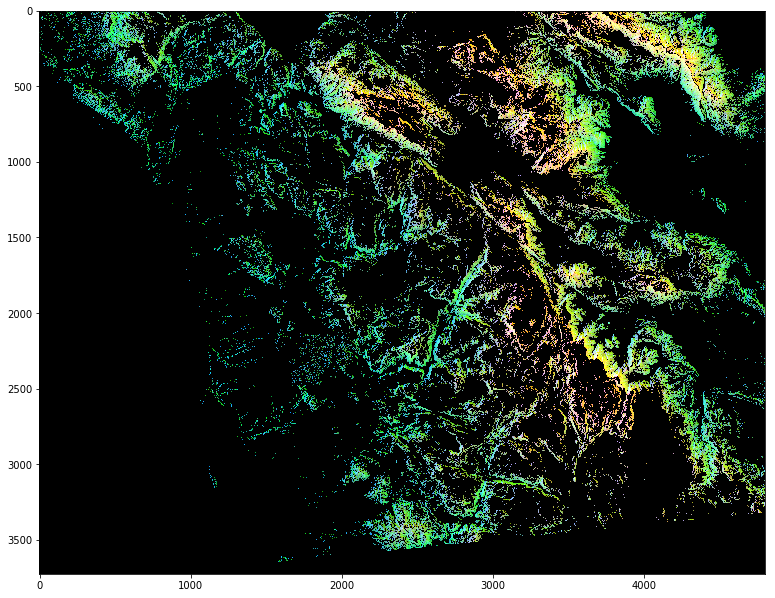

In [71]:
photo_data = misc.imread("C:\\Users\\Sauraj\\Downloads\\DataSets\\wifire\\sd-3layers.jpg")
filter_mask= photo_data[:,:,1] < 150   # we get green pixel those intensity is less then 250
photo_data[filter_mask]=0
plt.figure(figsize=(13,13))
plt.imshow(photo_data)

# Detecting the Red High intensity pixel

C:\Users\Sauraj\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: DeprecationWarning: `imread` is deprecated!
`imread` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``imageio.imread`` instead.
  """Entry point for launching an IPython kernel.


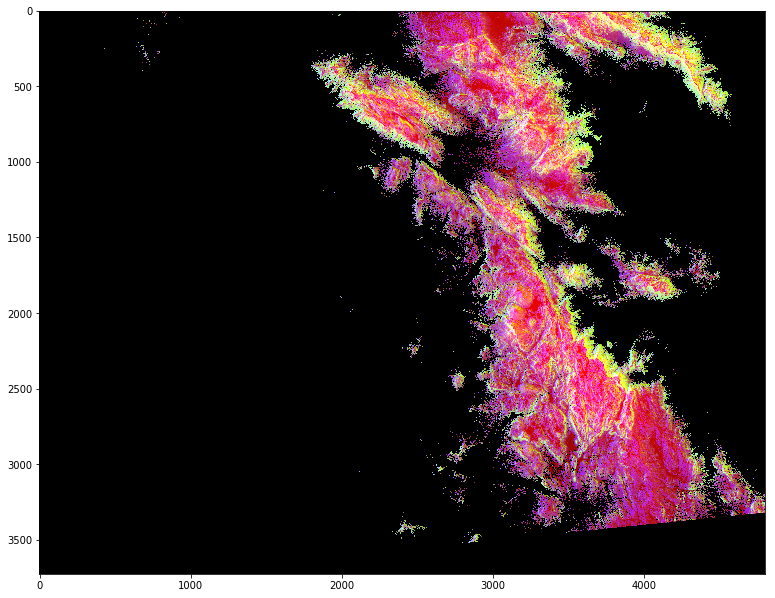

In [72]:
photo_data = misc.imread("C:\\Users\\Sauraj\\Downloads\\DataSets\\wifire\\sd-3layers.jpg")
filter_mask= photo_data[:,:,0] < 150   # we get red pixel those intensity is less then 150
photo_data[filter_mask]=0
plt.figure(figsize=(13,13))
plt.imshow(photo_data)

# Detecting the Blue High intensity pixel

C:\Users\Sauraj\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: DeprecationWarning: `imread` is deprecated!
`imread` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``imageio.imread`` instead.
  """Entry point for launching an IPython kernel.


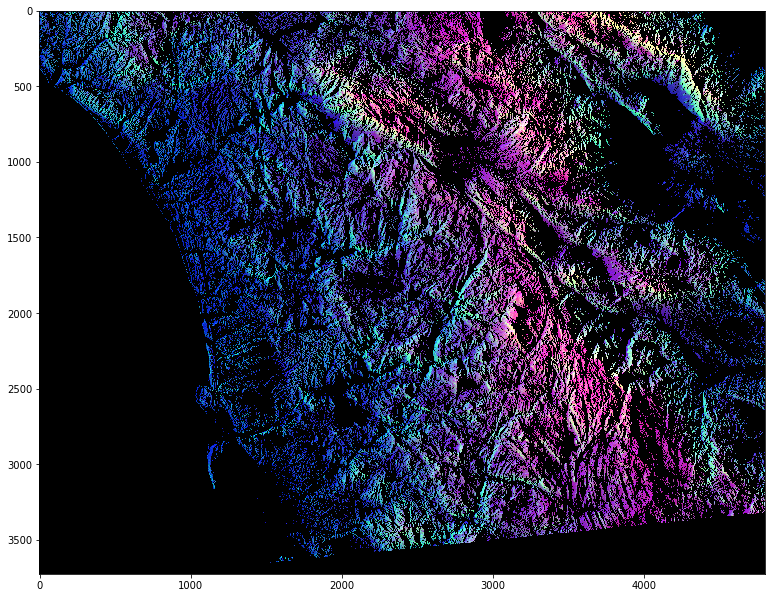

In [73]:
photo_data = misc.imread("C:\\Users\\Sauraj\\Downloads\\DataSets\\wifire\\sd-3layers.jpg")
filter_mask= photo_data[:,:,2] < 150   # we get blue pixel those intensity is less then 150
photo_data[filter_mask]=0
plt.figure(figsize=(13,13))
plt.imshow(photo_data)

# finally all three color intensity

C:\Users\Sauraj\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: DeprecationWarning: `imread` is deprecated!
`imread` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``imageio.imread`` instead.
  """Entry point for launching an IPython kernel.


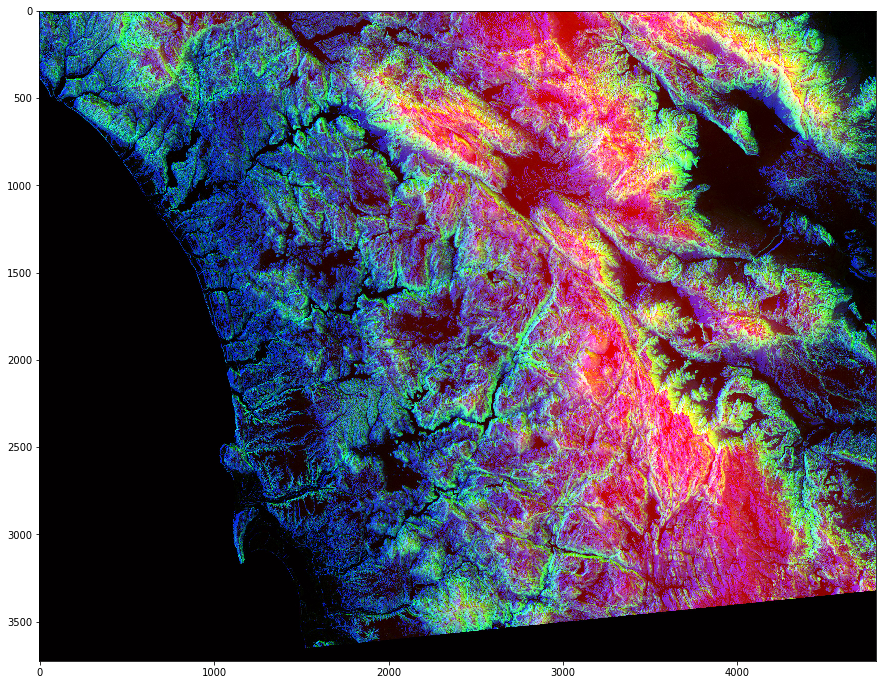

In [76]:
photo_data = misc.imread("C:\\Users\\Sauraj\\Downloads\\DataSets\\wifire\\sd-3layers.jpg")

red_mask= photo_data[:,:0] <150
green_mask= photo_data[:,:1] >100
blue_mask= photo_data[:,:0] <100

final_mask =np.logical_and(red_mask,green_mask,blue_mask)

photo_data[final_mask]=0
plt.figure(figsize=(15,15))
plt.imshow(photo_data)